# import modules & set parametres

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import math
from scipy.optimize import leastsq
from sklearn.metrics import r2_score
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
#mpl.rcParams

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [2]:
mpl.rc('lines', linewidth=1, color='black')
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = ['Times New Roman'] + mpl.rcParams['font.serif']
font = {'weight' : 'normal',
        'size'   : 15}
mpl.rc('font', **font)  # pass in the font dict as kwargs
lw = 2
fs = 20
oh_label=['0','1/16','1/8','3/16','1/4']

In [3]:
mpl.rcParams.keys()

KeysView(RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.avconv_args': [],
          'animation.avconv_path': 'avconv',
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': [],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.html_args': [],
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': 'line',
          'axes.edgecolor': 'black',
          'axes.facecolor': 'white',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
        

In [4]:
#a = sorted([f.name for f in mpl.font_manager.fontManager.ttflist])
#for i in a:
#    print(i)

# define functions

In [3]:
def get_xy(file_name):
    data = np.loadtxt(file_name)
    x=data[:, 0]
    y=data[:, 1]
    return x,y

def get_y(file_name):
    y = np.loadtxt(file_name)
    return y

def get_xyz(file_name):
    data = np.loadtxt(file_name)
    x=data[:, 0]
    y=data[:, 1]
    z=data[:, 2]
    return x,y,z

def get_watcoverage(file):
    data = np.loadtxt(file)
    wata = data.T[0]
    watb = data.T[1]
    wata_ave = data.T[2]
    watb_ave = data.T[3]
    return wata, watb, wata_ave, watb_ave

# test

## workfunction

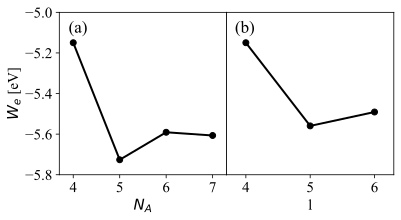

In [4]:
fig = plt.figure(figsize=(6,3))

wf_len = [-5.149603399,-5.726198312,-5.590743526,-5.606586373]
wf_layer = [-5.149603399,-5.55932857,-5.490934547]

plt.subplot(1,2,1)
x = [i for i in range(4,8)]
plt.plot(x,wf_len,'-o',color = 'black', linewidth= lw)
plt.xlabel(r'$N_A$',fontsize = fs-5)
plt.ylabel(r' $W_e$ [eV] ',fontsize = fs-5)
plt.xticks([i for i in range(4,8)],fontsize = fs-5)
plt.yticks([i/10 for i in range(-58,-49,2)],fontsize = fs-5)
plt.xlim((3.7,7.3))
plt.ylim((-5.8,-5.0))
plt.text(3.9, -5.1, r'(a)',fontsize = fs-3)

plt.subplot(1,2,2)
x = [i for i in range(4,7)]
plt.plot(x,wf_layer,'-o',color = 'black', linewidth= lw)
plt.xlabel(r'l',fontsize = fs-5)
plt.xticks([i for i in range(4,7)],fontsize = fs-5)
plt.yticks([],fontsize = fs-5)
plt.text(3.83, -5.1, r'(b)',fontsize = fs-3)
plt.xlim((3.7,6.3))
plt.ylim((-5.8,-5.0))
plt.subplots_adjust(wspace =0)

plt.savefig("../jpcc_pic/si_wf.pdf",bbox_inches = 'tight',dpi=1200)

plt.show()

## water adsorption energy

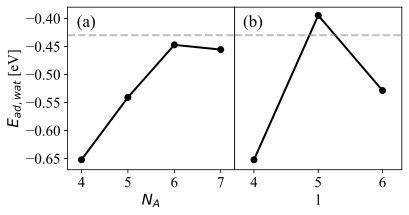

In [5]:
fig = plt.figure(figsize=(6,3))

ad_len = [-0.652327004,-0.540981326,-0.447267066,-0.455729486]
ad_layer = [-0.652327004,-0.394680314,-0.528801802]

plt.subplot(1,2,1)
x = [i for i in range(4,8)]
plt.plot(x,ad_len,'-o',color = 'black', linewidth= lw)
plt.xlabel(r'$N_A$',fontsize = fs-5)
plt.ylabel(r' $E_{ad,wat}$ [eV] ',fontsize = fs-5)
plt.xticks([i for i in range(4,8)],fontsize = fs-5)
plt.yticks([i/100 for i in range(-65,-39,5)],fontsize = fs-5)
plt.xlim((3.7,7.3))
plt.ylim((-0.67,-0.38))
plt.text(3.9, -0.415, r'(a)',fontsize = fs-3)
plt.axhline(y=-0.43,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)

plt.subplot(1,2,2)
x = [i for i in range(4,7)]
plt.plot(x,ad_layer,'-o',color = 'black', linewidth= lw)
plt.xlabel(r'l',fontsize = fs-5)
plt.xticks([i for i in range(4,7)],fontsize = fs-5)
plt.yticks([])
plt.text(3.83, -0.415, r'(b)',fontsize = fs-3)
plt.xlim((3.7,6.3))
plt.ylim((-0.67,-0.38))
plt.axhline(y=-0.43,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)

plt.subplots_adjust(wspace =0)

plt.savefig("../jpcc_pic/si_wat_ad_ener.pdf",bbox_inches = 'tight',dpi=600)
plt.show()

## Fermi energy 

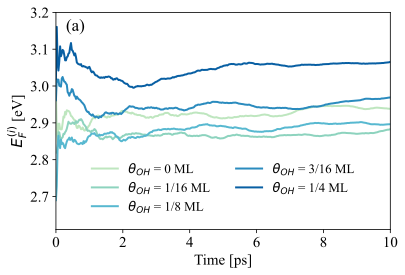

In [6]:
fig = plt.figure(figsize=(6,4))

for i in range(5):
    data = "./data/test_ef/ave/"+str(i)+".dat"
    y = get_y(data)
    x = [i*0.5/1000*50 for i in range(len(y))]

    plt.plot(x,y,'-',color = plt.get_cmap('GnBu')(0.3+i*0.15), lw = 2, label=r'$\theta_{OH}$ = '+oh_label[i]+r' ML')

plt.xlabel(r'Time [ps]',fontsize=fs-5)
plt.ylabel(r'$E_F^{(i)}$ [eV]',fontsize=fs-5)
plt.xticks([i for i in range(0,11,2)],fontsize=fs-5)
plt.yticks([i/10 for i in range(27,33)],fontsize=fs-5)
#plt.text(4, -0.41, r'(b)',fontsize=fs-3)
plt.xlim((0,10))
plt.ylim((2.61,3.2))
plt.text(0.3, 3.15, r'(a)',fontsize=fs-3)
#plt.legend(bbox_to_anchor=(0.5, 0.05),loc='lower center', ncol = 2,borderaxespad=0,frameon=False,fontsize=fs-7)
plt.legend(bbox_to_anchor=(0.5, 0.05),loc='lower center', ncol = 2,borderaxespad=0,frameon=False,fontsize=fs-7)

plt.savefig("../jpcc_pic/si_fermi.pdf",bbox_inches = 'tight',dpi=300)

plt.show()

## electrostatic potential

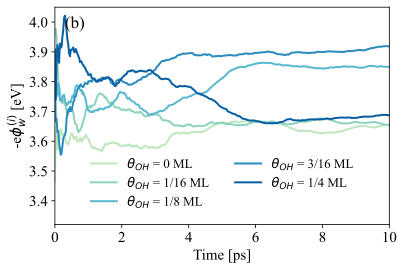

In [7]:
fig = plt.figure(figsize=(6,4))

for i in range(5):
    data = "./data/test_pot/ave/"+str(i)+".dat"
    y = get_y(data)
    x = [i*0.5/1000*50 for i in range(len(y))]

    plt.plot(x,y,'-',color = plt.get_cmap('GnBu')(0.3+i*0.15), lw = 2, label=r'$\theta_{OH}$ = '+oh_label[i]+r' ML')

plt.xlabel(r'Time [ps]',fontsize=fs-5)
plt.ylabel(r'-e$\phi_w^{(i)}$ [eV]',fontsize=fs-5)
plt.xticks([i for i in range(0,11,2)],fontsize=fs-5)
plt.yticks([i/10 for i in range(33,41)],fontsize=fs-5)
#plt.text(4, -0.41, r'(b)',fontsize=fs-3)
plt.xlim((0,10))
plt.ylim((3.32,4.05))
plt.text(0.3, 3.98, r'(b)',fontsize=fs-3)
plt.legend(bbox_to_anchor=(0.5, 0.05),loc='lower center', ncol = 2,borderaxespad=0,frameon=False,fontsize=fs-7)

plt.savefig("../jpcc_pic/si_pot.pdf",bbox_inches = 'tight',dpi=300)
plt.show()

# water density and dipole

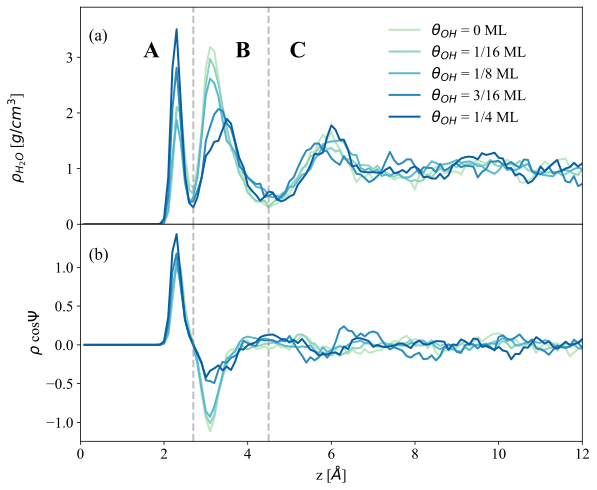

In [7]:
plt.figure(figsize=(9,8))

plt.subplot(2,1,1) 

density = []
x = []
y = []
for i in range(5):
    density.append("./data/wat_density/"+str(i)+".dat")
    tmp1,tmp2 = get_xy(density[i])
    x.append(tmp1)
    y.append(tmp2)

for i in range(5):
    plt.plot(np.array(x[i])+0.05, y[i],color = plt.get_cmap('GnBu')(0.3+i*0.15), label=r'$\theta_{OH}$ = '+oh_label[i]+r' ML') 
plt.xlim((0, 12))
plt.ylim((0,3.9))
plt.legend(loc='upper right')
plt.legend(bbox_to_anchor=(0.9, 0.95), ncol = 1,borderaxespad=0,frameon=False,fontsize=fs-5)
plt.xticks([],fontsize=fs) #remove the x label for the second figure
plt.yticks([i for i in range(4)],fontsize=fs-5)
#plt.ylabel(r' $\rho_{H_2O}$ / ($g/cm^3$) ',fontsize=fs-5)
plt.text(-1.75, 0.75, r' $\rho_{H_2O}$ [$g/cm^3$] ',fontsize=fs-5, rotation='vertical')
plt.axvline(x=2.7,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)
plt.axvline(x=4.5,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)

plt.text(0.2, 3.3, r'(a)',fontsize=fs-3)
plt.text(1.5, 3, r'A',fontsize=fs+3, fontweight='bold')
plt.text(3.7, 3, r'B',fontsize=fs+3, fontweight='bold')
plt.text(5, 3, r'C',fontsize=fs+3, fontweight='bold')

plt.subplot(2,1,2) 

ori = []
x = []
y = []
for i in range(5):
    ori.append("./data/wat_ori/"+str(i)+".dat")
    tmp2 = get_y(ori[i])
    tmp1,tmp2 = get_xy(ori[i])
    x.append(tmp1)
    y.append(tmp2)

for i in range(5):
    plt.plot(np.array(x[i])+0.05, y[i],color = plt.get_cmap('GnBu')(0.3+i*0.15), linewidth= lw) 
plt.xlim((0, 12))

plt.ylabel(r' $\rho$ cos$\Psi$ ',fontsize=fs-5)
plt.xlabel(r'z [$\AA$]',fontsize=fs-5)
plt.xticks(fontsize=fs-5)
plt.yticks([i/2 for i in range(-2,3)],fontsize=fs-5)
plt.axvline(x=2.7,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)
plt.axvline(x=4.5,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)
plt.text(0.2, 1.1, r'(b)',fontsize=fs-3)

plt.subplots_adjust(hspace =0)

plt.savefig("./wat_den_and_dip.png",bbox_inches = 'tight',dpi=300)
plt.show()

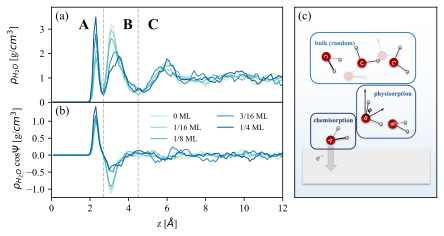

In [8]:
fig = plt.figure(figsize=(7,3.5),dpi=300)
gs = plt.GridSpec(2, 5, wspace=0.1, hspace=0)

fs = 15
lw = 1

#ax = fig.add_subplot(gs[0,0:3])
#ax = fig.add_subplot(gs[1,0:3])
#ax = fig.add_subplot(gs[:,3:5])

plt.subplot(gs[:,3:5])
img = plt.imread('./int_wat_pic.png')
plt.imshow(img)
plt.xticks([])
plt.yticks([])

plt.subplot(gs[0,0:3])
density = []
x = []
y = []
for i in range(5):
    density.append("./data/wat_density/"+str(i)+".dat")
    tmp1,tmp2 = get_xy(density[i])
    x.append(tmp1)
    y.append(tmp2)

for i in range(5):
    plt.plot(np.array(x[i])+0.05, y[i],color = plt.get_cmap('GnBu')(0.3+i*0.15), label=oh_label[i]+r' ML', linewidth= lw) 
plt.xlim((0, 12))
plt.ylim((0,3.9))
#plt.legend(loc='upper right',bbox_to_anchor=(0.95, 0.98), ncol = 2,borderaxespad=0,frameon=False,fontsize=fs-7)
plt.xticks([],fontsize=fs) #remove the x label for the second figure
plt.yticks([i for i in range(4)],fontsize=fs-5)
#plt.ylabel(r' $\rho_{H_2O}$ / ($g/cm^3$) ',fontsize=fs-5)
plt.text(-2.3, 0.75, r' $\rho_{H_2O}$ [g/$cm^3$] ',fontsize=fs-5, rotation='vertical')
plt.axvline(x=2.7,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)
plt.axvline(x=4.5,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)

plt.text(0.2, 3.4, r'(a)',fontsize=fs-3)
plt.text(12.8, 3.4, r'(c)',fontsize=fs-3)
plt.text(1.4, 3, r'A',fontsize=fs, fontweight='bold')
plt.text(3.7, 3, r'B',fontsize=fs, fontweight='bold')
plt.text(5, 3, r'C',fontsize=fs, fontweight='bold')

plt.subplot(gs[1,0:3])

ori = []
x = []
y = []
for i in range(5):
    ori.append("./data/wat_ori/"+str(i)+".dat")
    tmp2 = get_y(ori[i])
    tmp1,tmp2 = get_xy(ori[i])
    x.append(tmp1)
    y.append(tmp2)

for i in range(5):
    plt.plot(np.array(x[i])+0.05, y[i],color = plt.get_cmap('GnBu')(0.3+i*0.15), label=oh_label[i]+r' ML', linewidth= lw) 

plt.legend(loc='upper right',bbox_to_anchor=(0.95, 0.92), ncol = 2,borderaxespad=0,frameon=False,fontsize=fs-7)
plt.ylabel(r' $\rho_{H_2O}$ cos$\Psi$ [g/$cm^3$]',fontsize=fs-5)
plt.xlabel(r'z [$\AA$]',fontsize=fs-5)
plt.xticks([i for i in range(0,13,2)],fontsize=fs-5)
plt.xlim((0, 12))
plt.yticks([i/2 for i in range(-2,3)],fontsize=fs-5)
plt.axvline(x=2.7,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)
plt.axvline(x=4.5,color='gray',linestyle='--',alpha = 0.5,linewidth=lw)
plt.text(0.2, 1.2, r'(b)',fontsize=fs-3)

plt.savefig("../jpcc_pic/int_wat.pdf",bbox_inches = 'tight',dpi=300)

plt.show()

<img src='int_wat_pic.png'>

# water coverage

[0.20805625, 0.190565625, 0.167909375, 0.2350421875, 0.290265625] [0.6671515625, 0.6537609375, 0.631690625, 0.57668125, 0.509359375]
a= 0.5867006867272909  b= -0.6536866302343967  c= 0.20212717744812259
cost:1
y=0.59x1+-0.65x2+0.20212717744812259
$R^2$ is  0.982382050157202


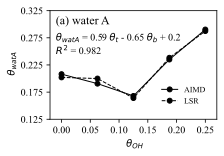

In [9]:
wata = []
watb = []

plt.figure(figsize=(3,2))

for i in range(5):
    wata_, watb_, wata_ave_, watb_ave_ = get_watcoverage("./data/wat_coverage/"+str(i)+".dat")
    wata.append(wata_ave_[-1])
    watb.append(watb_ave_[-1])
print(wata,watb)
x=[i/16 for i in range(5)]
  
plt.plot(x,wata,'-o',ms = 5,color = 'black',label=r'AIMD')

plt.ylabel(r' $\theta_{watA}$',fontsize=fs-5)
plt.xlabel(r' $\theta_{OH}$',fontsize=fs-5)
#plt.legend(bbox_to_anchor=(1.05, 0.1), loc=3, borderaxespad=0)
plt.xticks(fontsize=fs-5)#remove the x label for the second figure
plt.yticks([i/1000 for i in range(125,330,50 )],fontsize=fs-5)
plt.ylim((0.125,0.325))

k_w = [0.23]*5
k_t = [i/10 for i in range(1,6,2)]
k_b = [-i/10 for i in range(1,6,2)]

r_t = [0,0.49915,0.281575,0.6822,0.802144]
cov_oh = [i/16 for i in range(5)]
r_t = np.array(r_t)
r_b = np.array([1]*5)-r_t
r_b[0] = 0
cov_t = cov_oh*r_t
cov_b = cov_oh*r_b
cov_wat = [0.20805625, 0.190565625, 0.167909375, 0.2350421875, 0.290265625]

k_w = np.array(k_w)
k_t = np.array(k_t)
k_b = np.array(k_b)
cov_wat = np.array(cov_wat)

def func(params, x1, x2):
    a, b, c = params
    return a * x1 + b * x2 + c

def error(params, x1, x2, y):
    return func(params, x1, x2) - y

def slovePara():
    p0 = [10, 10, 10]
    Para = leastsq(error, p0, args=(cov_t,cov_b,cov_wat))
    return Para

def solution():
    Para = slovePara()
    a, b, c = Para[0]
    print ("a=",a," b=",b," c=",c)
    print ("cost:" + str(Para[1]))
    print("y="+str(round(a,2))+"x1+"+str(round(b,2))+"x2+"+str(c))
    return a,b,c

a,b,c = solution()    
#plt.plot(cov_oh,cov_wat,'-o',color='black',label=r'DFTMD')
cov_wat_ = a*cov_t+b*cov_b+c
plt.plot(cov_oh,cov_wat_,'--o',ms = 5, color='black',label=r'LSR')

print(r"$R^2$ is ",r2_score(cov_wat,cov_wat_))
plt.xticks([i*0.05 for i in range(6)],fontsize=fs-5)
plt.xlim((-0.02,0.27))
plt.text(-0.01, 0.3, r'(a) water A',fontsize=fs-3)
plt.text(-0.01, 0.27, r"$\theta_{watA}$ = "+str(round(a,2))+r" $\theta_t$ - 0.65 $\theta_b$ + "+str(round(c,2)),fontsize=fs-5)
plt.text(-0.01, 0.245, r"$R^2$ = "+str(round(r2_score(cov_wat,cov_wat_),3)),fontsize=fs-5)
plt.legend(bbox_to_anchor=(0.95, 0.1), loc='lower right', borderaxespad=0,frameon=False,fontsize=fs-7)

plt.savefig("../jpcc_pic/wata_cov.pdf",bbox_inches = 'tight',dpi=1200)
plt.show()

[0.20805625, 0.190565625, 0.167909375, 0.2350421875, 0.290265625] [0.6671515625, 0.6537609375, 0.631690625, 0.57668125, 0.509359375]


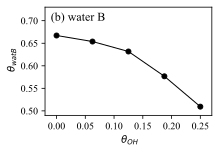

In [10]:
wata = []
watb = []

plt.figure(figsize=(3,2))

for i in range(5):
    wata_, watb_, wata_ave_, watb_ave_ = get_watcoverage("./data/wat_coverage/"+str(i)+".dat")
    wata.append(wata_ave_[-1])
    watb.append(watb_ave_[-1])
print(wata,watb)
x=[i/16 for i in range(5)]
  
plt.plot(x,watb,'-o',ms = 5 ,color = 'black',linewidth=lw)
plt.xticks(fontsize=fs-5)
plt.yticks(fontsize=fs-5)
plt.ylabel(r' $\theta_{watB}$',fontsize=fs-5)
plt.xlabel(r' $\theta_{OH}$',fontsize=fs-5)
plt.yticks([i/100 for i in range(50,76,5)],fontsize=fs-5)
plt.ylim((0.49,0.73))
plt.xticks([i*0.05 for i in range(6)],fontsize=fs-5)
plt.xlim((-0.02,0.27))
plt.text(-0.01, 0.7, r'(b) water B',fontsize=fs-3)
plt.savefig("../jpcc_pic/watb_cov.pdf",bbox_inches = 'tight',dpi=1200)
plt.show()

# water A & B angle

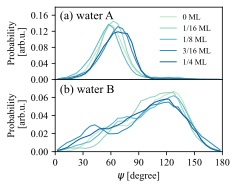

In [11]:
plt.figure(figsize=(3,2.67))

plt.subplot(2,1,1) 

fs = 15
lw = 1

density = []
x = []
y = []
for i in range(5):
    density.append("./data/wata_psi/"+str(i)+".dat")
    tmp1,tmp2 = get_xy(density[i])
    x.append(tmp1)
    y.append(tmp2)

for i in range(5):
    plt.plot(x[i], y[i],color = plt.get_cmap('GnBu')(0.3+i*0.15), label = oh_label[i]+r' ML') 
plt.xlim((0, 180))
plt.ylim((0,0.18))
plt.legend(loc='upper right',bbox_to_anchor=(0.95, 0.95), ncol = 1,borderaxespad=0,frameon=False,fontsize=fs-7)
plt.xticks([],fontsize=fs) #remove the x label for the second figure
plt.yticks([i*0.04 for i in range(5)],fontsize=fs-5)
plt.ylabel('Probability\n [arb.u.]',fontsize=fs-5)
plt.text(5, 0.15, r'(a) water A',fontsize=fs-3)
plt.subplot(2,1,2) 

ori = []
x = []
y = []
for i in range(5):
    ori.append("./data/watb_psi/"+str(i)+".dat")
    tmp2 = get_y(ori[i])
    tmp1,tmp2 = get_xy(ori[i])
    x.append(tmp1)
    y.append(tmp2)

for i in range(5):
    plt.plot(x[i], y[i],color = plt.get_cmap('GnBu')(0.3+i*0.15), linewidth= lw) 
plt.xlim((0, 180))
plt.ylim((0,0.08))
plt.ylabel('Probability\n [arb.u.]',fontsize=fs-5)
plt.xlabel(r'$\psi$ [degree]',fontsize=fs-5)
plt.xticks([i for i in range(0,181,30)],fontsize=fs-5)
plt.yticks([i*0.02 for i in range(4)],fontsize=fs-5)
plt.text(5, 0.065, r'(b) water B',fontsize=fs-3)
plt.subplots_adjust(hspace =0)

plt.savefig("../jpcc_pic/wat_ori.pdf",bbox_inches = 'tight',dpi=300)
plt.show()

# water A configurations

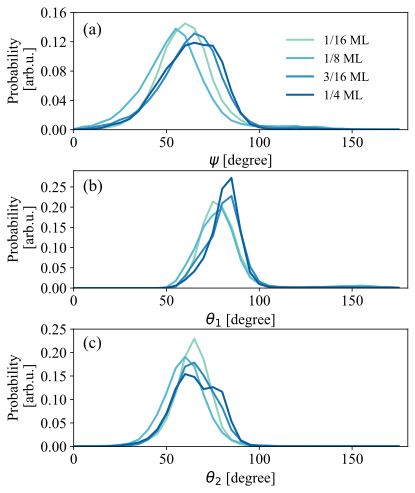

In [12]:
fs = 20
lw = 2

fig, axs = plt.subplots(3, 1, figsize=(6, 8))

for i in range(1,5):
    x1,y1,z1 = get_xyz("./data/hb_wata_config/top/"+str(i)+".dat")
    x2,y2,z2 = get_xyz("./data/hb_wata_config/no/"+str(i)+".dat")
    x0 = np.append(z1,z2)
    y0 = np.append(x1,x2)
    z0 = np.append(y1,y2)
    
    n1, b1, p1 = plt.hist(x0,alpha = 0,range = (0,180), bins=36)
    n2, b2, p2 = plt.hist(y0,alpha = 0,range = (0,180),bins=36)
    n3, b3, p3 = plt.hist(z0,alpha = 0,range = (0,180),bins=36)
    
    axs[0].plot(b1[:len(n1)],np.array(n1)/len(x0),linewidth = lw, color = plt.get_cmap('GnBu')(0.3+i*0.15), label = oh_label[i]+r' ML')
    axs[1].plot(b1[:len(n2)],np.array(n2)/len(y0),linewidth = lw, color = plt.get_cmap('GnBu')(0.3+i*0.15))
    axs[2].plot(b1[:len(n3)],np.array(n3)/len(z0),linewidth = lw, color = plt.get_cmap('GnBu')(0.3+i*0.15))
  

axs[0].set(xlim=(0,180),ylim=(0,0.16))
axs[0].set_ylabel('Probability\n [arb.u.]',fontsize= fs-5)

axs[1].set(xlim=(0,180),ylim=(0,0.29))
axs[1].set_ylabel('Probability\n [arb.u.]',fontsize= fs-5)

axs[2].set(xlim=(0,180),ylim=(0,0.25))
axs[2].set_ylabel('Probability\n [arb.u.]',fontsize= fs-5)

axs[0].set_xlabel(r'$\psi$ [degree]',fontsize= fs-5)
axs[1].set_xlabel(r'$\theta_1$ [degree]',fontsize= fs-5)
axs[2].set_xlabel(r'$\theta_2$ [degree]',fontsize= fs-5)

axs[0].set_yticks([i/100 for i in range(0,17,4)])
axs[1].set_yticks([i/100 for i in range(0,30,5)])
axs[2].set_yticks([i/100 for i in range(0,26,5)])

axs[0].text(5, 0.13, r"(a)" ,fontsize=fs-3)
axs[1].text(5, 0.24, r"(b)" ,fontsize=fs-3)
axs[2].text(5, 0.21, r"(c)" ,fontsize=fs-3)

axs[0].legend(loc='upper right',bbox_to_anchor=(0.9, 0.85), ncol = 1,borderaxespad=0,frameon=False,fontsize=fs-7)
    
plt.subplots_adjust(hspace = 0.35)

plt.savefig("../jpcc_pic/si_wata_config.pdf",bbox_inches = 'tight',dpi=300)

plt.show()

# co-ad model & water A $\psi$

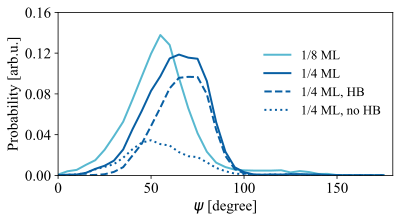

In [13]:
fig = plt.figure(figsize=(6,3))

x1,y1,z1 = get_xyz("./data/hb_wata_config/top/2.dat")
x2,y2,z2 = get_xyz("./data/hb_wata_config/no/2.dat")

z1 = np.array(z1)
z2 = np.array(z2)
z = np.append(z1,z2)

n1, b1, p1 = plt.hist(z1,alpha = 0,range = (0,180), bins=36)
n2, b2, p2 = plt.hist(z2,alpha = 0,range = (0,180),bins=36)
n3, b3, p3 = plt.hist(z,alpha = 0,range = (0,180),bins=36)

#plt.plot(b1[:len(n1)],np.array(n1)/len(z),'--',color = plt.get_cmap('GnBu')(0.3+2*0.15))
#plt.plot(b2[:len(n2)],np.array(n2)/len(z),':',color = plt.get_cmap('GnBu')(0.3+2*0.15))
plt.plot(b2[:len(n3)],np.array(n3)/len(z),linewidth = lw,color = plt.get_cmap('GnBu')(0.3+2*0.15),label = r"1/8 ML")

x1,y1,z1 = get_xyz("./data/hb_wata_config/top/4.dat")
x2,y2,z2 = get_xyz("./data/hb_wata_config/no/4.dat")

z1 = np.array(z1)
z2 = np.array(z2)
z = np.append(z1,z2)

n1, b1, p1 = plt.hist(z1,alpha = 0,range = (0,180), bins=36)
n2, b2, p2 = plt.hist(z2,alpha = 0,range = (0,180),bins=36)
n3, b3, p3 = plt.hist(z,alpha = 0,range = (0,180),bins=36)

plt.plot(b1[:len(n3)],np.array(n3)/len(z),linewidth = lw,color = plt.get_cmap('GnBu')(0.3+4*0.15),label = r"1/4 ML")
plt.plot(b1[:len(n1)],np.array(n1)/len(z),'--',linewidth = lw,color = plt.get_cmap('GnBu')(0.3+4*0.15),label = r"1/4 ML, HB")
plt.plot(b1[:len(n2)],np.array(n2)/len(z),':',linewidth = lw,color = plt.get_cmap('GnBu')(0.3+4*0.15),label = r"1/4 ML, no HB")


plt.xlim((0, 180))
plt.ylim((0,0.15))
plt.ylabel(r'Probability [arb.u.]',fontsize=fs-5)
plt.xlabel(r'$\psi$ [degree]',fontsize=fs-5)
plt.xticks(fontsize=fs-5)
plt.yticks([i*0.04 for i in range(5)],fontsize=fs-5)

plt.legend(loc='upper right',bbox_to_anchor=(0.98, 0.8), ncol = 1,borderaxespad=0,frameon=False,fontsize=fs-7)

plt.savefig("../jpcc_pic/si_wata_coad.pdf",bbox_inches = 'tight',dpi=300)

plt.show()


# (no use) charge on Pt vs distance to O

In [ ]:


label = [r'(a) 1 OH', r'(b) 2 OH', r'(c) 3 OH', r'(d) 4 OH']

for i in range(1,5):
    fig, ax = plt.subplots(figsize=(7,6))
    data = "./data/charge_on_pt/3d/"+str(i)+".dat"
    x,y1,y2 = get_xyz(data)

    d = []
    c_m = []

    for j in range(len(x)):
        if (x[j] < 5.5):
            d.append(x[j])
            c_m.append(y1[j])
    print(np.array(d).min())
    
    h,x,y,ax_ = ax.hist2d(d,c_m,bins=50,density = True, range = ([1.8,5.5],[-0.15,0.15]),cmap = 'cividis')
    ax.set_xticks([i for i in range(2,6)])
    ax.tick_params(labelsize= fs-5)
    ax.set_xlabel(r'$d_{Pt-O}$ [Å]',fontsize= fs-5)
    ax.set_ylabel(r'Mulliken charge',fontsize= fs-5)
    ax.text(2, 0.12, label[i-1],fontsize=fs-3,color = 'white')
    norm = mpl.colors.Normalize(vmin=1.3, vmax=2.5)
    fcb = fig.colorbar(ax_,ax=ax)
    plt.savefig("./si/charge_pt_"+str(i)+".png",bbox_inches = 'tight',dpi=200)


# charge distribution on O/H

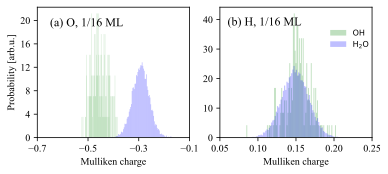

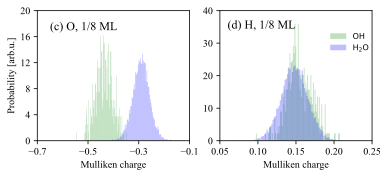

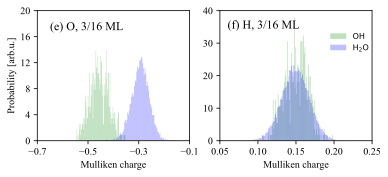

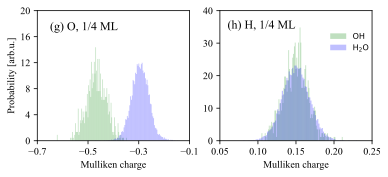

In [14]:

fs = 15

label = [r'(a) O, 1/16 ML', r'(b) H, 1/16 ML', r'(c) O, 1/8 ML',\
         r'(d) H, 1/8 ML', r'(e) O, 3/16 ML', r'(f) H, 3/16 ML',\
         r'(g) O, 1/4 ML', r'(h) H, 1/4 ML']

for i in range(1,5):
    fig, ax = plt.subplots(1, 2,figsize=(6,2.4))
    d1 = "./data/charge_on_o_h/"+str(i)+"/out-1.dat"
    d2 = "./data/charge_on_o_h/"+str(i)+"/out-2.dat"
    d3 = "./data/charge_on_o_h/"+str(i)+"/out-3.dat"
    d4 = "./data/charge_on_o_h/"+str(i)+"/out-4.dat"

    m1,h1=get_xy(d1)
    m2,h2=get_xy(d2)
    m3,h3=get_xy(d3)
    m4,h4=get_xy(d4)

    n, bins, patches = ax[0].hist(m1, 100, density=True, facecolor='g', alpha=0.25,label = r'$\rm{OH}$')
    n, bins, patches = ax[0].hist(m3, 100, density=True, facecolor='b', alpha=0.25,label = r'$\rm{H}_2\rm{O}$')
    ax[0].set(xlim=(-0.7,-0.1))
    if i == 1:
        ax[0].set_yticks([i for i in range(0,24,4)])
        ax[0].text(-0.65, 19, label[2*i-2],fontsize=fs-3)
    else:
        ax[0].set_yticks([i for i in range(0,24,4)])
        ax[0].text(-0.65, 17, label[2*i-2],fontsize=fs-3)
    ax[0].set_xticks([i/10 for i in range(-7,0,2)])
    
    ax[0].tick_params(labelsize= fs-5)
    ax[0].set_xlabel(r'Mulliken charge',fontsize= fs-5)
    ax[0].set_ylabel(r'Probability [arb.u.]',fontsize= fs-5)
    

    n, bins, patches = ax[1].hist(m2, 100, density=True, facecolor='g', alpha=0.25,label = r'$\rm{OH}$')
    n, bins, patches = ax[1].hist(m4, 100, density=True, facecolor='b', alpha=0.25,label = r'$\rm{H}_2\rm{O}$')
    ax[1].set(xlim=(0.06,0.22))
    ax[1].set_xticks([i*0.05 for i in range(1,6)])
    #
    ax[1].tick_params(labelsize= fs-5)
    ax[1].set_xlabel(r'Mulliken charge',fontsize= fs-5)
    #ax[1].set_ylabel(r'Probability density',fontsize= fs-5)
    if i == 1:
        ax[1].set_yticks([i for i in range(0,45,10)])
        ax[1].text(0.06, 38, label[2*i-1],fontsize=fs-3)
    else:
        ax[1].set_yticks([i for i in range(0,45,10)])
        ax[1].text(0.06, 34.5, label[2*i-1],fontsize=fs-3)
    #ax[0].legend(bbox_to_anchor=(0.7, 0.7), loc=3,borderaxespad=0,frameon=False,fontsize=fs-5)
    ax[1].legend(bbox_to_anchor=(1, 0.85), loc='upper right',borderaxespad=0,frameon=False,fontsize=fs-7)
    
    plt.savefig("../jpcc_pic/si_charge_o_h_"+str(i)+".pdf",bbox_inches = 'tight',dpi=300)


# (no use) radical distribution functions

<Figure size 432x288 with 0 Axes>

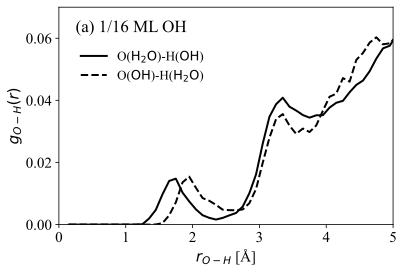

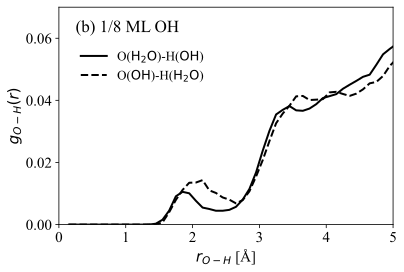

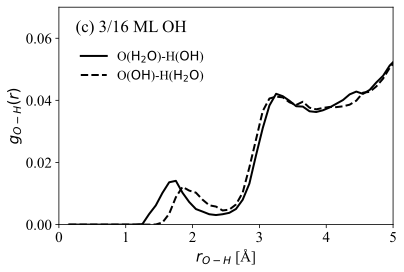

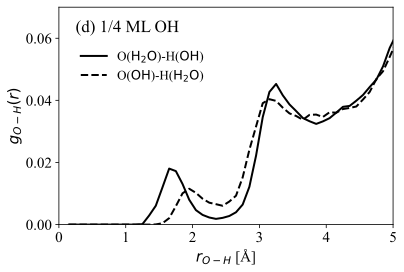

In [101]:
plt.figure(figsize=(6,4))
label = [r'(a) 1/16 ML OH', r'(b) 1/8 ML OH', r'(c) 3/16 ML OH', r'(d) 1/4 ML OH']
for i in range(1,5):
    fig = plt.figure()
    ax = plt.axes()
    data1 = "./data/rdf/o_oh_h_wat/"+str(i)+".dat"
    data2 = "./data/rdf/o_wat_h_oh/"+str(i)+".dat"

    x1,y1 = get_xy(data1)
    x2,y2 = get_xy(data2)
    
    y1 = np.array(y1)
    y1 = y1/np.sum(y1)
    y2 = np.array(y2)
    y2 = y2/np.sum(y2)
    
    ax.plot(x1,y1,'-',color = 'black', linewidth= lw,label = r'O($\rm{H}_2\rm{O}$)-H($\rm{OH}$)')
    ax.plot(x2,y2,'--',color = 'black', linewidth= lw,label = r'O($\rm{OH}$)-H($\rm{H}_2\rm{O}$)')
    ax.set(xlim=(0,5), ylim=(0,0.07))
    ax.set_xticks([i for i in range(0,6)])
    ax.set_yticks([i*0.01 for i in range(0,7,2)])
    ax.tick_params(labelsize= fs-5)
    ax.set_xlabel(r'$r_{O-H}$ [Å]',fontsize= fs-5)
    ax.set_ylabel(r'$g_{O-H}(r)$',fontsize= fs-5)
    ax.text(0.25, 0.062, label[i-1],fontsize=fs-3)
    ax.legend(loc='upper right')
    ax.legend(bbox_to_anchor=(0.05, 0.63), loc=3,borderaxespad=0,frameon=False,fontsize=fs-7)
    plt.savefig("./si/rdf_"+str(i)+".eps",bbox_inches = 'tight',dpi=600)

# OH spatial distribution

<ipython-input-14-1544fd1acaaf>:33: MatplotlibDeprecationWarning: The 'norm' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = fig.colorbar(ax_, norm=mpl.colors.Normalize(vmin=np.min(h), vmax=np.max(h)), cax = cbaxes)


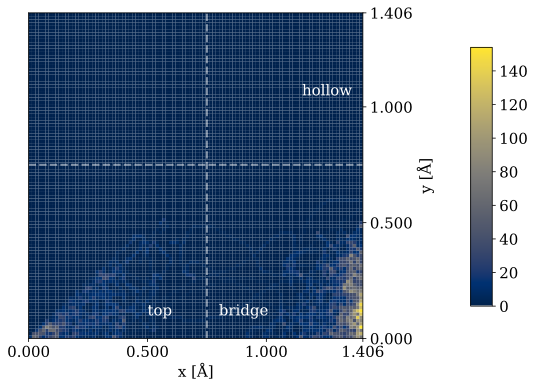

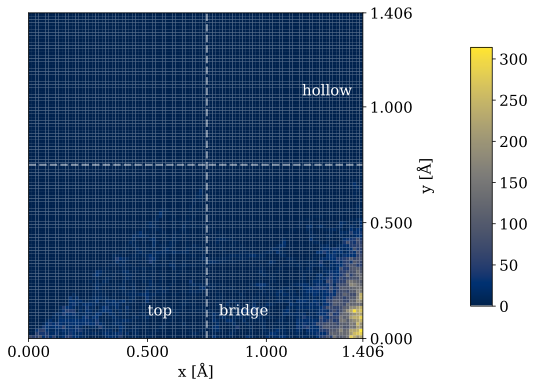

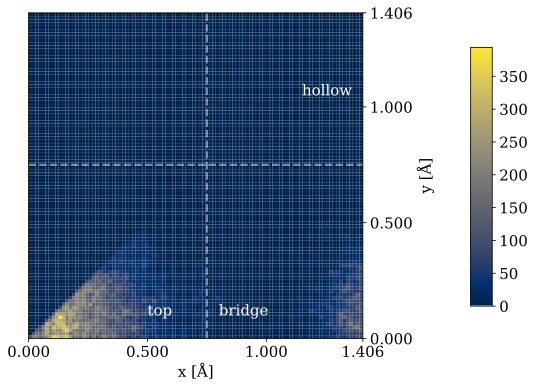

In [14]:
label = [r'(a) 1 OH', r'(b) 2 OH', r'(c) 3 OH', r'(d) 4 OH']

for i in range(1,4):
    fig, ax = plt.subplots(figsize=(6,6))
    data = "./data/oh_heatmap/"+str(i)+".dat"
    x,y = get_xy(data)
    
    for j in range(len(x)):
        if (y[j] > x[j]):
            tmp = y[j]
            y[j] = x[j]
            x[j] = tmp
            

    h,x0,y0,ax_ = ax.hist2d(x, y, bins=100,range=[[0,1.406],[0,1.406]],cmap = 'cividis')
    h = np.array(h)

    ax.yaxis.set_ticks_position('right')
    ax.yaxis.set_label_position('right')
    
    ax.set_xticks([0.0,0.5,1.0,1.406])
    ax.set_yticks([0.0,0.5,1.0,1.406])
    ax.tick_params(labelsize= fs-5)
    ax.set_xlabel(r'x [Å]',fontsize= fs-5)
    ax.set_ylabel(r'y [Å]',fontsize= fs-5)
    #ax.text(1.1, 1.35, label[i-1],fontsize=fs-3,color = 'white')
    ax.text(1.15, 1.05, 'hollow',fontsize=fs-5,color = 'white')
    ax.text(0.8, 0.1, 'bridge',fontsize=fs-5,color = 'white')
    ax.text(0.5, 0.1, 'top',fontsize=fs-5,color = 'white')
    ax.axvline(x=0.75,color='white',linestyle='--',alpha = 0.5,linewidth=lw)
    ax.axhline(y=0.75,color='white',linestyle='--',alpha = 0.5,linewidth=lw)
    cbaxes = fig.add_axes([1.15, 0.2, 0.05, 0.6]) 
    cb = fig.colorbar(ax_, norm=mpl.colors.Normalize(vmin=np.min(h), vmax=np.max(h)), cax = cbaxes) 
    plt.savefig("./si/oh_heatmap_"+str(i)+".png",bbox_inches = 'tight',dpi=300)



<ipython-input-12-f09f45051ce5>:36: MatplotlibDeprecationWarning: The 'norm' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = fig.colorbar(ax_, norm=mpl.colors.Normalize(vmin=np.min(h), vmax=np.max(h)), cax = cbaxes)


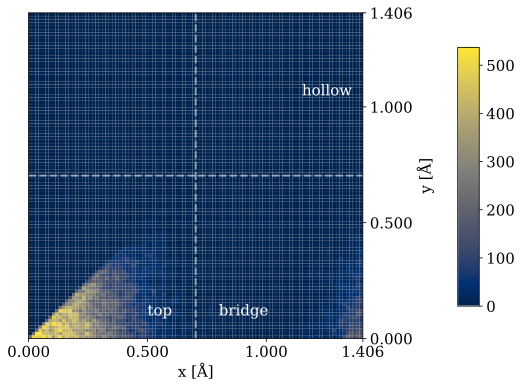

In [12]:
label = [r'(a) 1 OH', r'(b) 2 OH', r'(c) 3 OH', r'(d) 4 OH']

for i in range(4,5):
    fig, ax = plt.subplots(figsize=(6,6))

    data = "./data/oh_heatmap/"+str(i)+".dat"
    x,y = get_xy(data)
    
    for j in range(len(x)):
        if (y[j] > x[j]):
            tmp = y[j]
            y[j] = x[j]
            x[j] = tmp
            

    h,x0,y0,ax_ = ax.hist2d(x, y, bins=100,range=[[0,1.406],[0,1.406]],cmap = 'cividis')
    h = np.array(h)

    ax.yaxis.set_ticks_position('right')
    ax.yaxis.set_label_position('right')

    ax.set_xticks([0.0,0.5,1.0,1.406])
    ax.set_yticks([0.0,0.5,1.0,1.406])
    ax.tick_params(labelsize= fs-5)
    ax.set_xlabel(r'x [Å]',fontsize= fs-5)
    ax.set_ylabel(r'y [Å]',fontsize= fs-5)
    #ax.text(1.1, 1.35, label[i-1],fontsize=fs-3,color = 'white')
    ax.text(1.15, 1.05, 'hollow',fontsize=fs-5,color = 'white')
    ax.text(0.8, 0.1, 'bridge',fontsize=fs-5,color = 'white')
    ax.text(0.5, 0.1, 'top',fontsize=fs-5,color = 'white')
    ax.axvline(x=0.703,color='white',linestyle='--',alpha = 0.5,linewidth=lw)
    ax.axhline(y=0.703,color='white',linestyle='--',alpha = 0.5,linewidth=lw)

    cbaxes = fig.add_axes([1.12, 0.2, 0.05, 0.6]) 
    # left, bottom, width, height
    cb = fig.colorbar(ax_, norm=mpl.colors.Normalize(vmin=np.min(h), vmax=np.max(h)), cax = cbaxes) 
    
    plt.savefig("./oh_heatmap.png",bbox_inches = 'tight',dpi=300)


# OH adsorption site analyses

In [ ]:
fs = 15

r_t = [0,0.49915,0.281575,0.6822,0.802144]
cov_oh = [i/16 for i in range(5)]
r_t = np.array(r_t)
r_b = np.array([1]*5)-r_t
r_b[0] = 0
cov_t = cov_oh*r_t
cov_b = cov_oh*r_b

width = 0.05  # the width of the bars

fig = plt.figure(figsize=(6,5),dpi=300)

ax1 = fig.add_subplot(111)

ax1.set_xlabel(r'$\theta_{OH}$',fontsize=fs-5)
ax1.set_ylabel(r'$\theta$',fontsize=fs-5)

ax2 = ax1.twinx()  # this is the important function
ax2.bar(x=cov_oh , height=r_b+r_t, width=0.02,color='tab:orange',alpha = 0.2,label=r'$\theta_b$ / $\theta_{OH}$')
ax2.bar(x=cov_oh , height=r_t, width=0.02,color='tab:blue',alpha = 0.5,label=r'$\theta_t$ / $\theta_{OH}$')

ax1.plot(cov_oh,cov_b,'-o',marker = 's',ms = 5, color = plt.get_cmap('coolwarm')(0.99),label=r'$\theta_b$')
ax1.plot(cov_oh,cov_t,'-o',ms = 5,color = plt.get_cmap('coolwarm')(0),label=r'$\theta_t$')
ax1.set_ylim(0,0.22)
ax1.set_yticks([i*0.05 for i in range(5)])

ax2.set_ylabel(r'$\theta$ / $\theta_{OH}$',fontsize=fs-5)

ax1.legend(bbox_to_anchor=(0.5,-0.4), loc='lower center',ncol = 2, borderaxespad=0,frameon=False,fontsize=fs-7)

plt.ylim((0,1))
plt.xlim((-0.02,0.27))
ax1.tick_params(length=6,width=2,labelsize=fs-5)
ax2.tick_params(axis='y',length=6,width=2,labelsize=fs-5)
ax2.axhline(y=0,color='grey',linestyle='-', alpha=0.3)

plt.legend(bbox_to_anchor=(0.5,-0.55), loc='lower center',ncol = 2,borderaxespad=0,frameon=False,fontsize=fs-7)

fig.tight_layout()

plt.savefig("./test_oh_ad_site.eps",bbox_inches = 'tight',dpi=300)

plt.show()

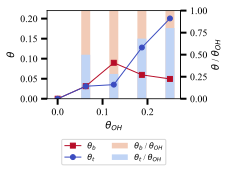

In [15]:
fs = 15

r_t = [0,0.49915,0.281575,0.6822,0.802144]
cov_oh = [i/16 for i in range(5)]
r_t = np.array(r_t)
r_b = np.array([1]*5)-r_t
r_b[0] = 0
cov_t = cov_oh*r_t
cov_b = cov_oh*r_b

width = 0.05  # the width of the bars

fig, ax = plt.subplots(figsize=(3.5,4), dpi=100)

ax.set_xlabel(r'$\theta_{OH}$',fontsize=fs-5)
ax.set_ylabel(r'$\theta$',fontsize=fs-5)
ax.set_ylim(0,0.22)
ax.set_yticks([i*0.05 for i in range(5)])
ax.tick_params(length=6,width=2,labelsize=fs-5)

def theta2r(x):
    return x/0.22

def r2theta(x):
    return x*0.22

y2 = ax.secondary_yaxis('right', functions=(theta2r, r2theta))
y2.tick_params(axis='y',length=6,width=2,labelsize=fs-5)
y2.set_ylabel(r'$\theta$ / $\theta_{OH}$',fontsize=fs-5)
y2.set_yticks([i/4 for i in range(5)])

ax.bar(x=cov_oh , height=(r_b+r_t)*0.22, width=0.02,color = plt.get_cmap('coolwarm')(0.6),label=r'$\theta_b$ / $\theta_{OH}$')
ax.bar(x=cov_oh , height=(r_t)*0.22, width=0.02,color = plt.get_cmap('coolwarm')(0.4),label=r'$\theta_t$ / $\theta_{OH}$')

ax.plot(cov_oh,cov_b,'-o',marker = 's',ms = 5, color = plt.get_cmap('coolwarm')(0.99),label=r'$\theta_b$')
ax.plot(cov_oh,cov_t,'-o',ms = 5,color = plt.get_cmap('coolwarm')(0),label=r'$\theta_t$')

ax.legend(bbox_to_anchor=(0.5,-0.75), loc='lower center',ncol = 2,borderaxespad=0,fontsize=fs-7)

fig.tight_layout()

plt.savefig("../jpcc_pic/oh_ad_site.pdf", bbox_inches = 'tight',dpi=300)

plt.show()

# (no used) OH & water A coverage relationship

a= 0.5867006867272909  b= -0.6536866302343967  c= 0.20212717744812259
cost:1
y=0.59x1+-0.65x2+0.20212717744812259
$R^2$ is  0.982382050157202


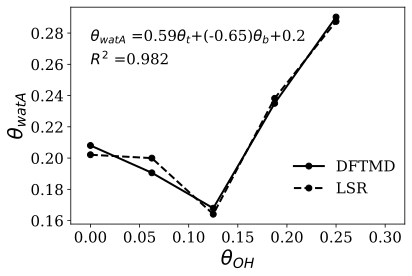

In [40]:

fig = plt.figure(figsize=(6,4))

k_w = [0.23]*5
k_t = [i/10 for i in range(1,6,2)]
k_b = [-i/10 for i in range(1,6,2)]

r_t = [0,0.49915,0.281575,0.6822,0.802144]
cov_oh = [i/16 for i in range(5)]
r_t = np.array(r_t)
r_b = np.array([1]*5)-r_t
r_b[0] = 0
cov_t = cov_oh*r_t
cov_b = cov_oh*r_b
cov_wat = [0.20805625, 0.190565625, 0.167909375, 0.2350421875, 0.290265625]

k_w = np.array(k_w)
k_t = np.array(k_t)
k_b = np.array(k_b)
cov_wat = np.array(cov_wat)

def func(params, x1, x2):
    a, b, c = params
    return a * x1 + b * x2 + c

def error(params, x1, x2, y):
    return func(params, x1, x2) - y

def slovePara():
    p0 = [10, 10, 10]
    Para = leastsq(error, p0, args=(cov_t,cov_b,cov_wat))
    return Para

def solution():
    Para = slovePara()
    a, b, c = Para[0]
    print ("a=",a," b=",b," c=",c)
    print ("cost:" + str(Para[1]))
    print("y="+str(round(a,2))+"x1+"+str(round(b,2))+"x2+"+str(c))
    return a,b,c

a,b,c = solution()    
plt.plot(cov_oh,cov_wat,'-o',color='black',label=r'DFTMD')
cov_wat_ = a*cov_t+b*cov_b+c
plt.plot(cov_oh,cov_wat_,'--o',color='black',label=r'LSR')

print(r"$R^2$ is ",r2_score(cov_wat,cov_wat_))
plt.xticks(fontsize = fs-5)
plt.yticks(fontsize = fs-5)
plt.xlim((-0.02,0.32))
plt.xlabel(r'$\theta_{OH}$',fontsize = fs)
plt.ylabel(r'$\theta_{watA}$',fontsize = fs)
plt.text(0, 0.275, r"$\theta_{watA}$ ="+str(round(a,2))+r"$\theta_t$+("+str(round(b,2))+r")$\theta_b$+"+str(round(c,2)),fontsize=fs-5)
plt.text(0, 0.26, r"$R^2$ ="+str(round(r2_score(cov_wat,cov_wat_),3)),fontsize=fs-5)
plt.legend(bbox_to_anchor=(0.65, 0.1), loc=3, borderaxespad=0,frameon=False,fontsize=fs-5)
plt.savefig("./oh_wata_coverage.png",bbox_inches = 'tight',dpi=200)

plt.show()

# (no use) OH distance to surfaces

In [ ]:
plt.figure(figsize=(9,9))

plt.subplot(3,1,1) 
x = []
y = []
for i in range(1,5):
    tmp1,tmp2 = get_xy("./data/oh_pos/top/"+str(i)+".dat")
    x.append(tmp1)
    y.append(tmp2)
    plt.plot(x[i-1], y[i-1],color = plt.get_cmap('GnBu')(0.3+i*0.15), linewidth= lw, label=str(i)+r' OH') 
plt.xlim((1, 3))
plt.ylim((0,0.38))
plt.xticks([],fontsize=fs) #remove the x label for the second figure
plt.yticks([i/10 for i in range(4)],fontsize=fs-5)
plt.ylabel(r'Abundance [a.u.]',fontsize=fs-5)
plt.text(1.1, 0.3, r'(a) top site',fontsize=fs-3)

plt.subplot(3,1,2) 
x = []
y = []
for i in range(1,5):
    tmp1,tmp2 = get_xy("./data/oh_pos/bridge/"+str(i)+".dat")
    x.append(tmp1)
    y.append(tmp2)
    plt.plot(x[i-1], y[i-1],color = plt.get_cmap('GnBu')(0.3+i*0.15), linewidth= lw) 
plt.xlim((1, 3))
plt.ylim((0,0.38))
plt.xticks([],fontsize=fs) #remove the x label for the second figure
plt.yticks([i/10 for i in range(4)],fontsize=fs-5)
plt.ylabel(r'Abundance [a.u.]',fontsize=fs-5)
plt.text(1.1, 0.3, r'(b) bridge site',fontsize=fs-3)

plt.subplot(3,1,3) 
x = []
y = []
for i in range(1,5):
    tmp1,tmp2 = get_xy("./data/oh_pos/total/"+str(i)+".dat")
    x.append(tmp1)
    y.append(tmp2)
    plt.plot(x[i-1], y[i-1],color = plt.get_cmap('GnBu')(0.3+i*0.15), linewidth= lw) 
plt.xlim((1, 3))
plt.ylim((0,0.38))
plt.xticks([i*0.5 for i in range(2,7)],fontsize=fs-5)
plt.yticks([i/10 for i in range(4)],fontsize=fs-5)
plt.ylabel(r'Abundance [a.u.]',fontsize=fs-5)
plt.xlabel(r'z [Å]',fontsize=fs-5)
plt.text(1.1, 0.3, r'(c) total',fontsize=fs-3)

plt.subplots_adjust(hspace =0)

#plt.savefig("./oh_angle.eps",bbox_inches = 'tight',dpi=300)
plt.show()

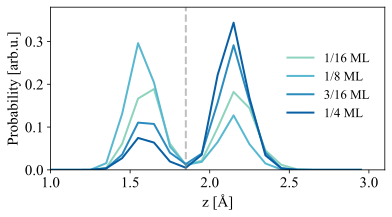

In [16]:
lw = 2
fs = 20

plt.figure(figsize=(6,3))

x = []
y = []
for i in range(1,5):
    tmp1,tmp2 = get_xy("./data/oh_pos/total/"+str(i)+".dat")
    x.append(tmp1)
    y.append(tmp2)
    plt.plot(x[i-1], y[i-1],lw = lw, color = plt.get_cmap('GnBu')(0.3+i*0.15), label=oh_label[i]+r' ML') 
plt.xlim((1, 3.1))
plt.ylim((0,0.38))
plt.xticks([i*0.5 for i in range(2,7)],fontsize=fs-5)
plt.yticks([i/10 for i in range(4)],fontsize=fs-5)
plt.ylabel(r'Probability [arb.u.]',fontsize=fs-5)
plt.xlabel(r'z [Å]',fontsize=fs-5)
#plt.text(1.3, 0.3, r'top',fontsize=fs-3, fontweight='bold')
#plt.text(2.25, 0.3, r'bridge',fontsize=fs-3, fontweight='bold')
plt.axvline(x=1.85,color='gray',linestyle='--',lw = lw, alpha = 0.5)
plt.legend(loc='upper right',bbox_to_anchor=(0.97, 0.75), ncol = 1,borderaxespad=0,frameon=False,fontsize=fs-7)

plt.savefig("../jpcc_pic/si_oh_pos.pdf",bbox_inches = 'tight',dpi=300)
plt.show()

# OH dipole direction

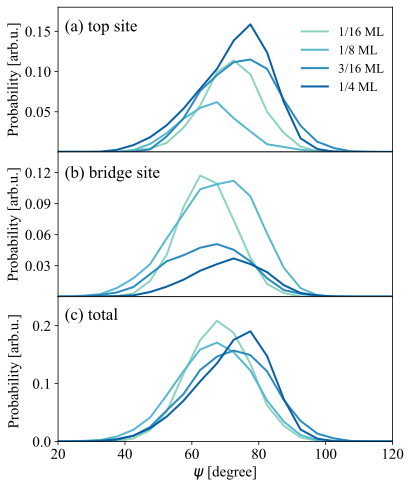

In [17]:
plt.figure(figsize=(6,8))

fs = 20
lw = 2

plt.subplot(3,1,1) 
x1 = []
y1 = []
for i in range(1,5):
    tmp1,tmp2 = get_xy("./data/oh_psi/top/"+str(i)+".dat")
    x1.append(tmp1)
    y1.append(tmp2)
    plt.plot(x1[i-1], y1[i-1],color = plt.get_cmap('GnBu')(0.3+i*0.15), linewidth= lw, label=oh_label[i]+r' ML') 
plt.xlim((20, 120))
plt.ylim((0,0.18))
plt.xticks([],fontsize=fs) #remove the x label for the second figure
plt.yticks([i/20 for i in range(1,4)],fontsize=fs-5)
plt.ylabel('Probability [arb.u.]',fontsize=fs-5)
plt.text(22, 0.15, r'(a) top site',fontsize=fs-3)
plt.legend(loc='upper right',bbox_to_anchor=(0.99, 0.9), ncol = 1,borderaxespad=0,frameon=False,fontsize=fs-7)
plt.subplot(3,1,2) 
x2 = []
y2 = []
for i in range(1,5):
    tmp1,tmp2 = get_xy("./data/oh_psi/bridge/"+str(i)+".dat")
    x2.append(tmp1)
    y2.append(tmp2)
    plt.plot(x2[i-1], y2[i-1],color = plt.get_cmap('GnBu')(0.3+i*0.15), linewidth= lw) 
plt.xlim((20, 120))
plt.ylim((0,0.14))
plt.xticks([],fontsize=fs) #remove the x label for the second figure
plt.yticks([i*0.03 for i in range(1,5)],fontsize=fs-5)
plt.ylabel('Probability [arb.u.]',fontsize=fs-5)
plt.text(22, 0.115, r'(b) bridge site',fontsize=fs-3)

plt.subplot(3,1,3) 
x = np.array(x1)
y = np.array(y1)+np.array(y2)
for i in range(1,5):
    plt.plot(x[i-1], y[i-1],color = plt.get_cmap('GnBu')(0.3+i*0.15), linewidth= lw) 
plt.xlim((20, 120))
plt.ylim((0,0.25))
plt.xticks([i for i in range(20,121,20)],fontsize=fs-5)
plt.yticks([i*0.1 for i in range(3)],fontsize=fs-5)
#plt.ylabel(r'Abundance [a.u.]',fontsize=fs-5)
plt.xlabel(r'$\psi$ [degree]',fontsize=fs-5)
plt.text(22, 0.21, r'(c) total',fontsize=fs-3)
plt.text(5,0.028, 'Probability [arb.u.]',fontsize=fs-5, rotation='vertical')

plt.subplots_adjust(hspace =0)

plt.savefig("../jpcc_pic/si_oh_ori.pdf",bbox_inches = 'tight',dpi=300)
plt.show()

# charge on OH

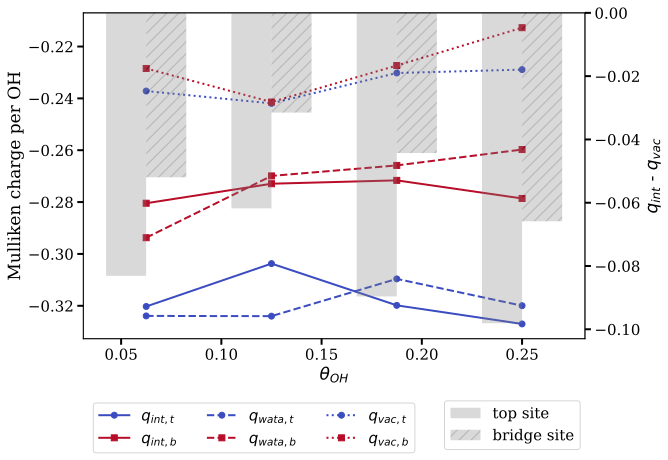

In [75]:
x=[0.0625,0.125,0.1875,0.25]
y1=[-0.280437,-0.272917,-0.271619,-0.278606] #bridge
y2=[-0.320264,-0.303724,-0.319832,-0.326999] #top
y3=[-0.228468,-0.241412,-0.22733,-0.21274]
y4=[-0.237164,-0.241933,-0.230213,-0.228905]
y5=[-0.29374,-0.269906,-0.265857,-0.259739]
y6=[-0.323906,-0.32399,-0.309622,-0.319962]

fs=20

fig = plt.figure(figsize=(9,6))

ax1 = fig.add_subplot(111)



ax1.set_xlabel(r'$\theta_{OH}$',fontsize=fs-3)
ax1.set_ylabel(r'Mulliken charge per OH',fontsize=fs-3)

ax2 = ax1.twinx()  # this is the important function
ax2.bar(np.array(x)-0.01, height=np.array(y2)-np.array(y4),label='top site', width=0.02, alpha=0.3, color='grey' )
ax2.bar(np.array(x)+0.01, height=np.array(y1)-np.array(y3),label='bridge site', \
        width=0.02, alpha=0.3, color='grey',hatch='//' )

ax1.plot(x,y2,'-o',color = plt.get_cmap('coolwarm')(0),label=r'$q_{int,t}$', linewidth= lw)
ax1.plot(x,y1,'-o',marker = 's',color = plt.get_cmap('coolwarm')(0.99),label=r'$q_{int,b}$', linewidth= lw)

ax1.plot(x,y6,'--o',color = plt.get_cmap('coolwarm')(0),label=r'$q_{wata,t}$', linewidth= lw)
ax1.plot(x,y5,'--o',marker = 's',color = plt.get_cmap('coolwarm')(0.99),label=r'$q_{wata,b}$', linewidth= lw)

ax1.plot(x,y4,':o',color = plt.get_cmap('coolwarm')(0),label=r'$q_{vac,t}$', linewidth= lw)
ax1.plot(x,y3,':o',marker = 's',color = plt.get_cmap('coolwarm')(0.99),label=r'$q_{vac,b}$', linewidth= lw)

ax2.set_ylabel(r'$q_{int}$ - $q_{vac}$',fontsize=fs-3)

ax1.legend(bbox_to_anchor=(0.02, -0.35), loc=3, ncol = 3,borderaxespad=0,fontsize=fs-5)
ax2.legend(bbox_to_anchor=(0.72, -0.34), loc=3, borderaxespad=0,fontsize=fs-5)

ax1.tick_params(length=6,width=2,labelsize=fs-5)
ax2.tick_params(axis='y',length=6,width=2,labelsize=fs-5)

plt.savefig("../jpcc_pic/si_figure12.tif",bbox_inches = 'tight',dpi=300)

plt.show()



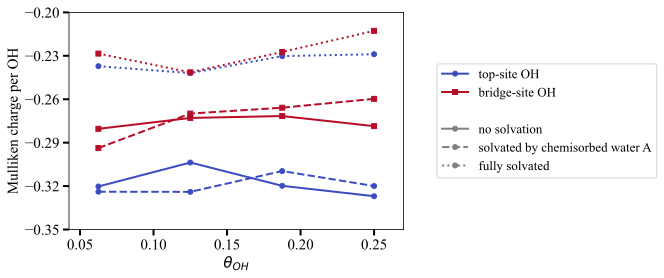

In [18]:
x=[0.0625,0.125,0.1875,0.25]
y1=[-0.280437,-0.272917,-0.271619,-0.278606] #bridge
y2=[-0.320264,-0.303724,-0.319832,-0.326999] #top
y3=[-0.228468,-0.241412,-0.22733,-0.21274]
y4=[-0.237164,-0.241933,-0.230213,-0.228905]
y5=[-0.29374,-0.269906,-0.265857,-0.259739]
y6=[-0.323906,-0.32399,-0.309622,-0.319962]

empty = [0]*4

fig = plt.figure(figsize=(6,4))

fs = 20
lw = 2
ax1 = fig.add_subplot(111)

ax1.set_xlabel(r'$\theta_{OH}$',fontsize=fs-5)
ax1.set_ylabel(r'Mulliken charge per OH',fontsize=fs-5)

#ax1.plot(x,y2,'-o',ms = 5,linewidth = lw, color = plt.get_cmap('coolwarm')(0),label=r'$q_{int,t}$')
#ax1.plot(x,y1,'-o',marker = 's',ms = 5,linewidth = lw,color = plt.get_cmap('coolwarm')(0.99),label=r'$q_{int,b}$')

#ax1.plot(x,y6,'--o',ms = 5,linewidth = lw,color = plt.get_cmap('coolwarm')(0),label=r'$q_{wata,t}$')
#ax1.plot(x,y5,'--o',marker = 's',ms = 5,linewidth = lw, color = plt.get_cmap('coolwarm')(0.99),label=r'$q_{wata,b}$')

#ax1.plot(x,y4,':o',ms = 5,linewidth = lw,color = plt.get_cmap('coolwarm')(0),label=r'$q_{vac,t}$')
#ax1.plot(x,y3,':o',marker = 's',ms = 5,linewidth = lw,color = plt.get_cmap('coolwarm')(0.99),label=r'$q_{vac,b}$')

ax1.plot(x,y2,'-o',ms = 5,linewidth = lw, color = plt.get_cmap('coolwarm')(0),label=r'top-site OH')
ax1.plot(x,y1,'-o',marker = 's',ms = 5,linewidth = lw,color = plt.get_cmap('coolwarm')(0.99),label=r'bridge-site OH')

ax1.plot(x,y6,'--o',ms = 5,linewidth = lw,color = plt.get_cmap('coolwarm')(0))
ax1.plot(x,y5,'--o',marker = 's',ms = 5,linewidth = lw, color = plt.get_cmap('coolwarm')(0.99))

ax1.plot(x,y4,':o',ms = 5,linewidth = lw,color = plt.get_cmap('coolwarm')(0))
ax1.plot(x,y3,':o',marker = 's',ms = 5,linewidth = lw,color = plt.get_cmap('coolwarm')(0.99))

ax1.plot(x,empty,'-o',ms = 5,linewidth = lw, color = 'white',label=r' ')
ax1.plot(x,empty,'-o',ms = 5,linewidth = lw, color = 'gray',label=r'no solvation')
ax1.plot(x,empty,'--o',ms = 5,linewidth = lw, color = 'gray',label=r'solvated by chemisorbed water A')
ax1.plot(x,empty,':o',ms = 5,linewidth = lw, color = 'gray',label=r'fully solvated')

ax1.set_yticks([i/100 for i in range(-35,-15,3)])
plt.xlim((0.0425,0.27))
plt.ylim((-0.35,-0.2))
ax1.legend(loc='center left',bbox_to_anchor=(1.1, 0.5), ncol = 1,borderaxespad=0,fontsize=fs-7)
ax1.tick_params(length=6,width=2,labelsize=fs-5)

plt.savefig("../jpcc_pic/si_oh_charge.pdf",bbox_inches = 'tight',dpi=300)

plt.show()


# OH HB

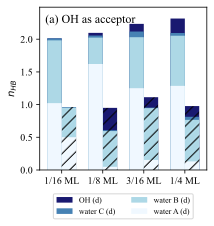

In [19]:
labels=[r'1/16 ML',r'1/8 ML',r'3/16 ML',r'1/4 ML']
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
fs = 15

fig,ax1 = plt.subplots(figsize=(3,3))

ta1=[1.02238806,1.621326467,1.250513046,1.286747232]
ta2=[0.960382651,0.403089763,0.780636177,0.766804578]
ta3=[0.030501853,0.032051851,0.086765856,0.041591672]
ta4=[0,0.041152446,0.116534741,0.221258658]

ba1=[0.50184686,0.048822076,0.154080134,0.131124238]
ba2=[0.451732056,0.545933814,0.791483113,0.635562435]
ba3=[0.007736847,0.014162926,0.008181246,0.046940645]
ba4=[0,0.340901973,0.159062303,0.163660486]


x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars


rects1 = ax1.bar(x - width/2, np.array(ta1)+np.array(ta2)+np.array(ta3)+np.array(ta4), \
                width,color='midnightblue',label=r'OH (d)')
rects2 = ax1.bar(x + width/2, np.array(ba1)+np.array(ba2)+np.array(ba3)+np.array(ba4), \
                width,color='midnightblue',hatch='//')


ax1.bar(x - width/2, np.array(ta1)+np.array(ta2)+np.array(ta3), width,color='steelblue',label=r'water C (d)')
ax1.bar(x + width/2, np.array(ba1)+np.array(ba2)+np.array(ba3), width,color='steelblue',hatch='//')

ax1.bar(x - width/2, np.array(ta1)+np.array(ta2), width,color='lightblue',label=r'water B (d)')
ax1.bar(x + width/2, np.array(ba1)+np.array(ba2), width,color='lightblue',hatch='//')

ax1.bar(x - width/2, np.array(ta1), width,color='aliceblue',label=r'water A (d)')
ax1.bar(x + width/2, np.array(ba1), width,color='aliceblue',hatch='//')

ax1.set_ylabel(r'$n_{HB}$',fontsize=fs-5)
ax1.set_ylim(0,2.4)
ax1.tick_params(axis='y',labelsize=fs-5)
#ax1.set_title('top/bridge-site OH as acceptor',fontsize=fs+5)
ax1.set_xticks(x)
ax1.set_xticklabels(labels,fontsize=fs-5)
plt.ylim((0,2.49))
#ax1.bar(x - width/2, np.array(ta1), width,color='aliceblue',label=r'top-site OH')
#ax1.bar(x + width/2, np.array(ba1), width,color='aliceblue',hatch='//',label=r'bridge-site OH')
ax1.text(-0.4, 2.25, r'(a) OH as acceptor',fontsize=fs-3)
ax1.legend(loc='lower center',bbox_to_anchor=(0.5, -0.3), ncol = 2,borderaxespad=0,fontsize=fs-7)
plt.savefig("../jpcc_pic/hb_a.pdf",bbox_inches = 'tight',dpi=300)

plt.show()

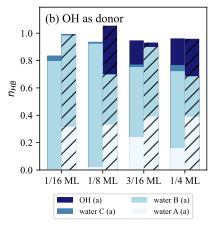

In [20]:
labels=[r'1/16 ML',r'1/8 ML',r'3/16 ML',r'1/4 ML']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig,ax = plt.subplots(figsize=(3,3))

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

ta1=[0.002303917,0.019177839,0.239409264,0.160452849]
ta2=[0.79420014,0.904199592,0.512765074,0.562173239]
ta3=[0.038265051,0.011941756,0.018775042,0.04489532]
ta4=[0,0.001154222,0.176109157,0.194463274]

ba1=[0.314914645,0.330375474,0.389762954,0.388634425]
ba2=[0.669062594,0.367888089,0.509072792,0.294942667]
ba3=[0.009134471,0,0.001284875,0.002811385]
ba4=[0,0.356578627,0.03117789,0.272293648]


rects1 = ax.bar(x - width/2, np.array(ta1)+np.array(ta2)+np.array(ta3)+np.array(ta4), \
                width,color='midnightblue',label=r'OH (a)')
rects2 = ax.bar(x + width/2, np.array(ba1)+np.array(ba2)+np.array(ba3)+np.array(ba4), \
                width,color='midnightblue',hatch='//')


ax.bar(x - width/2, np.array(ta1)+np.array(ta2)+np.array(ta3), width,color='steelblue',label=r'water C (a)')
ax.bar(x + width/2, np.array(ba1)+np.array(ba2)+np.array(ba3), width,color='steelblue',hatch='//')

ax.bar(x - width/2, np.array(ta1)+np.array(ta2), width,color='lightblue',label=r'water B (a)')
ax.bar(x + width/2, np.array(ba1)+np.array(ba2), width,color='lightblue',hatch='//')

ax.bar(x - width/2, np.array(ta1), width,color='aliceblue',label=r'water A (a)')
ax.bar(x + width/2, np.array(ba1), width,color='aliceblue',hatch='//')
ax.legend(bbox_to_anchor=(1.1, 0), loc=3, borderaxespad=0,fontsize=fs-5)

ax.tick_params(axis='y',labelsize=fs-5)
ax.set_ylim(0,1.19)
ax.set_ylabel(r'$n_{HB}$',fontsize=fs-5)
ax.set_xticks(x)
ax.set_xticklabels(labels,fontsize=fs-5)
ax.bar(x - width/2, np.array(ta1), width,color='aliceblue')
ax.bar(x + width/2, np.array(ba1), width,color='aliceblue',hatch='//')
ax.legend(loc='lower center',bbox_to_anchor=(0.5, -0.3), ncol = 2,borderaxespad=0,fontsize=fs-7)
ax.text(-0.4, 1.08, r'(b) OH as donor',fontsize=fs-3)

plt.savefig("../jpcc_pic/hb_d.pdf",bbox_inches = 'tight',dpi=300)

plt.show()

# (no used) surface potential shift (electrode potential)

In [ ]:

fig = plt.figure(figsize=(6,4))

coverage=[i/16 for i in range(5)]
deltaphi=[-1.14087,-1.08162,-0.90627,-0.91149,-1.23926]


plt.plot(coverage,deltaphi,'-o',color='black',label='$\Delta\Phi$')

plt.xlabel(r' $\theta_{OH}$',fontsize=fs)
plt.ylabel(r' $\Delta\Phi$ [eV]',fontsize=fs)

plt.xticks(fontsize=fs-5)
plt.yticks([i*0.1-1.3 for i in range(5)],fontsize=fs-5)
plt.ylim((-1.28,-0.88))
plt.savefig("./deltaphi.png",bbox_inches = 'tight',dpi=200)

plt.show()

# surface potential energy shift (with different species)

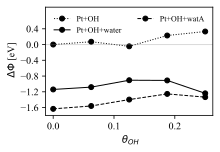

In [159]:
fs = 15
lw = 1

fig = plt.figure(figsize=(3,2))

coverage=[0,0.0625,0.125,0.1875,0.25]
y1=[0,0.071493135,-0.0450284,0.22989175,0.3314055]
y2=[-1.633895,-1.56089,-1.39832,-1.25422,-1.33574]
y3=[-1.14087,-1.08162,-0.90627,-0.91149,-1.23926]


plt.plot(coverage,y1,':o',ms = 5, color='black',label=r'$\Delta\Phi_{OH}$')
plt.plot(coverage,y3,'-o',ms = 5, color='black',label=r'$\Delta\Phi_{OH,watA}$')
plt.plot(coverage,y2,'--o',ms = 5, color='black',label=r'$\Delta\Phi$')


plt.axhline(y=0,color='grey',linestyle='-', alpha=0.3)
plt.legend(bbox_to_anchor=(0.5, 0.95), loc='upper center', ncol = 2,borderaxespad=0,frameon=False,fontsize=fs-7)
plt.xlabel(r' $\theta_{OH}$',fontsize=fs-5)
plt.ylabel(r' $\Delta\Phi$ [eV]',fontsize=fs-5)
plt.xticks(fontsize=fs-5)
plt.yticks([i*0.4-1.6 for i in range(6)],fontsize=fs-5)
plt.ylim((-1.8,0.95))
#plt.savefig("./deltaphi_all.png",bbox_inches = 'tight',dpi=600)

plt.show()

## potential

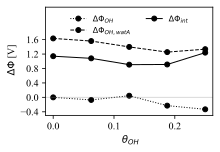

In [5]:
fs = 15
lw = 1

fig = plt.figure(figsize=(3,2))

coverage=[0,0.0625,0.125,0.1875,0.25]
y1=[0,0.071493135,-0.0450284,0.22989175,0.3314055]
y2=[-1.633895,-1.56089,-1.39832,-1.25422,-1.33574]
y3=[-1.14087,-1.08162,-0.90627,-0.91149,-1.23926]


plt.plot(coverage,-np.array(y1),':o',ms = 5, color='black',label=r'$\Delta\Phi_{OH}$')
plt.plot(coverage,-np.array(y2),'--o',ms = 5, color='black',label=r'$\Delta\Phi_{OH,watA}$')
plt.plot(coverage,-np.array(y3),'-o',ms = 5, color='black',label=r'$\Delta\Phi_{int}$')


plt.axhline(y=0,color='grey',linestyle='-', alpha=0.3)
plt.legend(bbox_to_anchor=(0.5, 0.95), loc='upper center', ncol = 2,borderaxespad=0,frameon=False,fontsize=fs-7)
plt.xlabel(r' $\theta_{OH}$',fontsize=fs-5)
plt.ylabel(r' $\Delta\Phi$ [V]',fontsize=fs-5)
plt.xticks(fontsize=fs-5)
plt.yticks(-np.array([i*0.4-1.6 for i in range(6)]),fontsize=fs-5)
plt.ylim((-0.5,2.5))

plt.savefig("../jpcc_pic/deltaphi.pdf",bbox_inches = 'tight',dpi=600)

plt.show()

## water B contribution

k= -0.258956175334609 b= -0.07599296712131287
$R^2$ is  0.8788785917350702


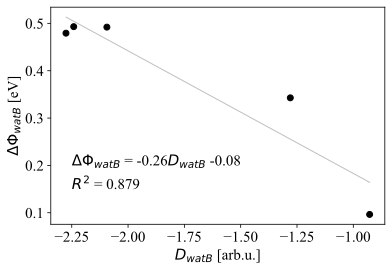

In [22]:
fig = plt.figure(figsize=(6,4))

fs = 20

x = [-2.24129,-2.27567,-2.09403,-1.27968,-0.927501]
y2=[-1.633895,-1.56089,-1.39832,-1.25422,-1.33574]
y3=[-1.14087,-1.08162,-0.90627,-0.91149,-1.23926]

x = np.array(x)
pot = np.array(y3)-np.array(y2)
#print(pot)
plt.plot(x, pot, 'o',color = 'black')

def linear_regression(x, y):  
    N = len(x) 
    sumx = sum(x) 
    sumy = sum(y) 
    sumx2 = sum(x**2) 
    sumxy = sum(x*y) 
  
    A = np.mat([[N, sumx], [sumx, sumx2]]) 
    b = np.array([sumy, sumxy]) 
  
    return np.linalg.solve(A, b) 
  
b, a = linear_regression(x, pot)
print("k=",a,"b=",b)
x = np.array(x)
y_ = a*x+b
plt.plot(x,y_,'-',color='gray',alpha = 0.5)

print(r"$R^2$ is ",r2_score(pot,y_))
plt.ylabel(r'$\Delta\Phi_{watB}$ [eV]',fontsize=fs-5)
plt.xlabel(r'$D_{watB}$ [arb.u.]',fontsize=fs-5)

#plt.xticks([i/100 for i in range(20,46,5)],fontsize=fs-5)
#plt.yticks([i/100 for i in range(-22,-9,3)],fontsize=fs-5)
#plt.xlim((0.215,0.44))
#plt.ylim((-0.22,-0.09))
plt.text(-2.25, 0.2, r"$\Delta\Phi_{watB}$ = "+str(round(a,2))+r"$D_{watB}$ "+str(round(b,2)),fontsize=fs-5)
plt.text(-2.25, 0.15, r"$R^2$ = "+str(round(r2_score(pot,y_),3)),fontsize=fs-5)
#plt.text(0.225, -0.105, r'(b)',fontsize=fs-3)
#plt.legend(bbox_to_anchor=(0.05, 0.15), loc=3,borderaxespad=0,fontsize=fs-5)

#plt.savefig("../jpcc_pic/si_watb_ori.pdf",bbox_inches = 'tight',dpi=600)

plt.show()

### potential

k= 0.258956175334609 b= 0.07599296712131287
$R^2$ is  0.8788785917350702


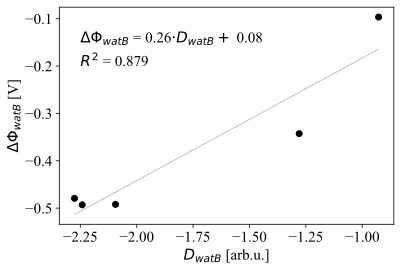

In [23]:
fig = plt.figure(figsize=(6,4))

fs = 20
lw = 2

x = [-2.24129,-2.27567,-2.09403,-1.27968,-0.927501]
y2=[-1.633895,-1.56089,-1.39832,-1.25422,-1.33574]
y3=[-1.14087,-1.08162,-0.90627,-0.91149,-1.23926]

x = np.array(x)
pot = np.array(y2)-np.array(y3)
#print(pot)
plt.plot(x, pot, 'o',color = 'black')

def linear_regression(x, y):  
    N = len(x) 
    sumx = sum(x) 
    sumy = sum(y) 
    sumx2 = sum(x**2) 
    sumxy = sum(x*y) 
  
    A = np.mat([[N, sumx], [sumx, sumx2]]) 
    b = np.array([sumy, sumxy]) 
  
    return np.linalg.solve(A, b) 
  
b, a = linear_regression(x, pot)
print("k=",a,"b=",b)
x = np.array(x)
y_ = a*x+b
plt.plot(x,y_,'-',color='gray',alpha = 0.5)

print(r"$R^2$ is ",r2_score(pot,y_))
plt.ylabel(r'$\Delta\Phi_{watB}$ [V]',fontsize=fs-5)
plt.xlabel(r'$D_{watB}$ [arb.u.]',fontsize=fs-5)

plt.text(-2.25, -0.15, r"$\Delta\Phi_{watB}$ = "+str(round(a,2))+r"$\cdot D_{watB}+$ "+str(round(b,2)),fontsize=fs-5)
plt.text(-2.25, -0.2, r"$R^2$ = "+str(round(r2_score(pot,y_),3)),fontsize=fs-5)

plt.savefig("../jpcc_pic/si_watb_ori.pdf",bbox_inches = 'tight',dpi=600)

plt.show()

# gas phase calculations for OH adsorption site effect

## total 

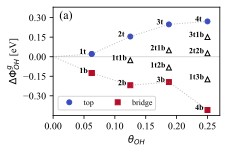

In [34]:

fig = plt.figure(figsize=(3,2))

fs = 15

x=[0.0625,0.0625,0.125,0.125,0.125,0.1875,0.1875,0.1875,0.1875,0.25,0.25,0.25,0.25,0.25]
y=[0.021025279,-0.125105588,0.154731176,-0.026998605,-0.218741993,0.248045564,\
 0.049085034,-0.082909087,-0.194276214,0.270886192,0.150841547,0.026445903,\
 -0.173575777,-0.408735943]

x1=[0,0.0625,0.125,0.1875,0.25]
y1=[0,0.021025279,0.154731176,0.248045564,0.270886192]
x2=[0,0.0625,0.125,0.1875,0.25]
y2=[0,-0.125105588,-0.218741993,-0.194276214,-0.408735943]

#for i in range(2):
#    plt.plot(x[i],y[i],'o',color = plt.get_cmap('coolwarm')(0+0.99*i))
#for i in range(3):
#    plt.plot(x[i+2],y[i+2],'o',color = plt.get_cmap('coolwarm')(0+0.99/2*i))
#for i in range(4):
#    plt.plot(x[i+5],y[i+5],'o',color = plt.get_cmap('coolwarm')(0+0.99/3*i))
#for i in range(5):
#    plt.plot(x[i+9],y[i+9],'o',color = plt.get_cmap('coolwarm')(0+0.99/4*i))

for i in range(len(x)):
    if i in [0,2,5,9]:
        plt.plot(x[i],y[i],'o',ms = 5,color = plt.get_cmap('coolwarm')(0))
    elif i in [1,4,8,13]:
        plt.plot(x[i],y[i],'o',marker = 's',ms = 5, color = plt.get_cmap('coolwarm')(0.99))
    else:
        plt.plot(x[i],y[i],marker='^',ms = 5,color = 'black',markerfacecolor='none')
plt.plot(x1,y1,':',color='grey',alpha=0.5)
plt.plot(x2,y2,':',color='grey',alpha=0.5)

plt.plot(x[0],y[0],'o',ms = 5, color = plt.get_cmap('coolwarm')(0),label='top')    
plt.plot(x[1],y[1],'o',marker = 's',ms = 5, color = plt.get_cmap('coolwarm')(0.99),label='bridge')

plt.ylabel(r'$\Delta\Phi_{OH}^g$ [eV]',fontsize=fs-5)
plt.xlabel(r'$\theta_{OH}$',fontsize=fs-5)
plt.xticks([i*0.05 for i in range(6)],fontsize=fs-5)
plt.yticks([i*0.15 for i in range(-2,4)],fontsize=fs-5)
plt.xlim((0,0.27))
plt.ylim((-0.45,0.38))
plt.axhline(y=0,color='grey',linestyle='-', alpha=0.3)

plt.text(x[0]-0.02,y[0],'1t',weight = 'heavy', fontsize=fs-7)
plt.text(x[0]-0.02,y[1],'1b',weight = 'heavy', fontsize=fs-7)

plt.text(x[2]-0.02,y[2],'2t',weight = 'heavy', fontsize=fs-7)
plt.text(x[2]-0.02,y[4],'2b',weight = 'heavy', fontsize=fs-7)
plt.text(x[2]-0.03,y[3],'1t1b',weight = 'heavy', fontsize=fs-7)

plt.text(x[5]-0.02,y[8],'3b',weight = 'heavy', fontsize=fs-7)
plt.text(x[5]-0.03,y[7],'1t2b',weight = 'heavy', fontsize=fs-7)
plt.text(x[5]-0.03,y[6],'2t1b',weight = 'heavy', fontsize=fs-7)
plt.text(x[5]-0.02,y[5],'3t',weight = 'heavy', fontsize=fs-7)

plt.text(x[9]-0.02,y[9],'4t',weight = 'heavy', fontsize=fs-7)
plt.text(x[9]-0.02,y[13],'4b',weight = 'heavy', fontsize=fs-7)
plt.text(x[9]-0.03,y[10],'3t1b',weight = 'heavy', fontsize=fs-7)
plt.text(x[9]-0.03,y[11],'2t2b',weight = 'heavy', fontsize=fs-7)
plt.text(x[9]-0.03,y[12],'1t3b',weight = 'heavy', fontsize=fs-7)

plt.text(0.01, 0.29, r'(a)',fontsize=fs-3)

plt.legend(bbox_to_anchor=(0.03, 0.05), loc=3, ncol=2, borderaxespad=0,fontsize=fs-7)

#plt.savefig("../jpcc_pic/si_figure11a.tif",bbox_inches = 'tight',dpi=300)

plt.show()


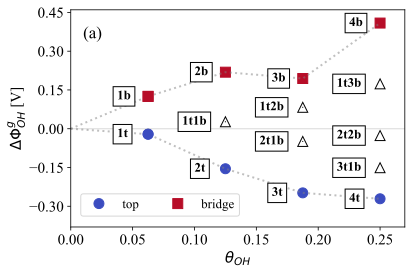

In [24]:

fig = plt.figure(figsize=(6,4))

fs = 20
lw = 2

x=[0.0625,0.0625,0.125,0.125,0.125,0.1875,0.1875,0.1875,0.1875,0.25,0.25,0.25,0.25,0.25]
y=[0.021025279,-0.125105588,0.154731176,-0.026998605,-0.218741993,0.248045564,\
 0.049085034,-0.082909087,-0.194276214,0.270886192,0.150841547,0.026445903,\
 -0.173575777,-0.408735943]

x1=[0,0.0625,0.125,0.1875,0.25]
y1=[0,0.021025279,0.154731176,0.248045564,0.270886192]
x2=[0,0.0625,0.125,0.1875,0.25]
y2=[0,-0.125105588,-0.218741993,-0.194276214,-0.408735943]

y = -np.array(y)
y1 = -np.array(y1)
y2 = -np.array(y2)

#for i in range(2):
#    plt.plot(x[i],y[i],'o',color = plt.get_cmap('coolwarm')(0+0.99*i))
#for i in range(3):
#    plt.plot(x[i+2],y[i+2],'o',color = plt.get_cmap('coolwarm')(0+0.99/2*i))
#for i in range(4):
#    plt.plot(x[i+5],y[i+5],'o',color = plt.get_cmap('coolwarm')(0+0.99/3*i))
#for i in range(5):
#    plt.plot(x[i+9],y[i+9],'o',color = plt.get_cmap('coolwarm')(0+0.99/4*i))

for i in range(len(x)):
    if i in [0,2,5,9]:
        plt.plot(x[i],y[i],'o',ms = 10,color = plt.get_cmap('coolwarm')(0))
    elif i in [1,4,8,13]:
        plt.plot(x[i],y[i],'o',marker = 's',ms = 10, color = plt.get_cmap('coolwarm')(0.99))
    else:
        plt.plot(x[i],y[i],marker='^',ms = 10,color = 'black',markerfacecolor='none')
plt.plot(x1,y1,':',color='grey',alpha=0.5, lw = lw)
plt.plot(x2,y2,':',color='grey',alpha=0.5, lw = lw)

plt.plot(x[0],y[0],'o',ms = 10, color = plt.get_cmap('coolwarm')(0),label='top')    
plt.plot(x[1],y[1],'o',marker = 's',ms = 10, color = plt.get_cmap('coolwarm')(0.99),label='bridge')

plt.ylabel(r'$\Delta\Phi_{OH}^g$ [V]',fontsize=fs-5)
plt.xlabel(r'$\theta_{OH}$',fontsize=fs-5)
plt.xticks([i*0.05 for i in range(6)],fontsize=fs-5)
plt.yticks([i*0.15 for i in range(-2,4)],fontsize=fs-5)
plt.xlim((0,0.27))
plt.ylim((-0.38,0.46))
plt.axhline(y=0,color='grey',linestyle='-', alpha=0.3)

plt.text(x[0]-0.025,y[0],'1t',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[0]-0.025,y[1],'1b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))

plt.text(x[2]-0.025,y[2],'2t',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[2]-0.025,y[4],'2b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[2]-0.035,y[3],'1t1b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))

plt.text(x[5]-0.025,y[8],'3b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[5]-0.035,y[7],'1t2b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[5]-0.035,y[6],'2t1b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[5]-0.025,y[5],'3t',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))

plt.text(x[9]-0.025,y[9],'4t',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[9]-0.025,y[13],'4b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[9]-0.035,y[10],'3t1b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[9]-0.035,y[11],'2t2b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))
plt.text(x[9]-0.035,y[12],'1t3b',weight = 'heavy', fontsize=fs-7,va = 'center',bbox=dict(facecolor='white'))

plt.text(0.01, 0.35, r'(a)',fontsize=fs-3)

plt.legend(bbox_to_anchor=(0.03, 0.05), loc=3, ncol=2, borderaxespad=0,fontsize=fs-7)

plt.savefig("../jpcc_pic/si_gas.pdf",bbox_inches = 'tight',dpi=300)

plt.show()



## eletronic 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


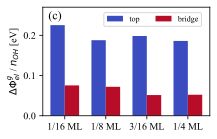

In [40]:
labels=[r'1/16 ML',r'1/8 ML',r'3/16 ML',r'1/4 ML']

fig,ax = plt.subplots(figsize=(3,2))

fs = 15

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

y1=[0.225397018,0.187934931,0.198356998,0.186154934]
y2=[0.075464688,0.072023185,0.051479063,0.05220186]

rects1 = ax.bar(np.array(x) - width/2, y1, width,color = plt.get_cmap('coolwarm')(0),label='top')
rects2 = ax.bar(np.array(x) + width/2, y2, width,color = plt.get_cmap('coolwarm')(0.99),label='bridge')

ax.set_ylim(0,0.27)
ax.tick_params(axis='y',labelsize=fs-5)
ax.set_xticks(x)
ax.set_xticklabels(labels,fontsize=fs-5)
ax.set_ylabel(r'$\Delta\Phi_{el}^g$ / $n_{OH}$ [eV]',fontsize=fs-5)
ax.text(-0.4, 0.24, r'(c)',fontsize=fs-3)
ax.legend(loc='upper right',bbox_to_anchor=(0.95, 0.95), ncol = 2,borderaxespad=0,fontsize=fs-7)

plt.savefig("./gas_phase_el.eps",bbox_inches = 'tight',dpi=300)

plt.show()

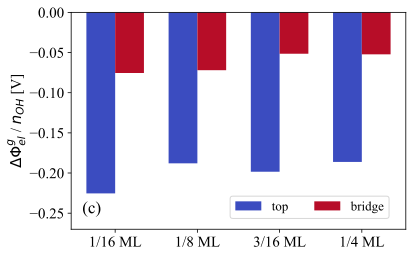

In [25]:
labels=[r'1/16 ML',r'1/8 ML',r'3/16 ML',r'1/4 ML']

fig,ax = plt.subplots(figsize=(6,4))

fs = 20

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

y1=[0.225397018,0.187934931,0.198356998,0.186154934]
y2=[0.075464688,0.072023185,0.051479063,0.05220186]

y1 = -np.array(y1)
y2 = -np.array(y2)

rects1 = ax.bar(np.array(x) - width/2, y1, width,color = plt.get_cmap('coolwarm')(0),label='top')
rects2 = ax.bar(np.array(x) + width/2, y2, width,color = plt.get_cmap('coolwarm')(0.99),label='bridge')

ax.set_ylim(-0.27,0)
ax.tick_params(axis='y',labelsize=fs-5)
ax.set_xticks(x)
ax.set_xticklabels(labels,fontsize=fs-5)
ax.set_ylabel(r'$\Delta\Phi_{el}^g$ / $n_{OH}$ [V]',fontsize=fs-5)
ax.text(-0.4, -0.25, r'(c)',fontsize=fs-3)
ax.legend(loc='lower right',bbox_to_anchor=(0.95, 0.05), ncol = 2,borderaxespad=0,fontsize=fs-7)

plt.savefig("../jpcc_pic/si_gas_el.pdf",bbox_inches = 'tight',dpi=300)

plt.show()

## dipole

a= -0.4720380052681757
cost:3
y=-0.47x
$R^2$ is  0.9748909450391255


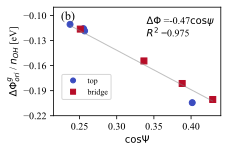

In [171]:

fig = plt.figure(figsize=(3,2))

x=[0.401576699,0.429174955,0.237232612,0.38804553,0.255416079,0.251024017,0.256858796,0.336624717]
y=[-0.204371739,-0.200570277,-0.110569343,-0.181394182,-0.115675144,-0.116237801,-0.118433386,-0.154385846]

def func(params, x):
    a = params
    return a * x

def error(params, x, y):
    return func(params, x) - y

def slovePara():
    p0 = [10]
    Para = leastsq(error, p0, args=(x,y))
    return Para

def solution():
    Para = slovePara()
    a = Para[0][0]
    print ("a=",a)
    print ("cost:" + str(Para[1]))
    print("y="+str(round(a,2))+"x")
    return a

a = solution()
for i in range(0,8,2):
    plt.plot(x[i],y[i],'o',color = plt.get_cmap('coolwarm')(0))
for i in range(1,8,2):
    plt.plot(x[i],y[i],'o',marker = 's',color = plt.get_cmap('coolwarm')(0.99))

plt.plot(x[0],y[0],'o',ms = 5, color = plt.get_cmap('coolwarm')(0),label='top')    
plt.plot(x[1],y[1],'o',marker = 's',ms = 5,color = plt.get_cmap('coolwarm')(0.99),label='bridge')
x = np.array(x)
y_ = a*x
plt.plot(x,y_,'-',color='gray',alpha = 0.5)

print(r"$R^2$ is ",r2_score(y,y_))
plt.ylabel(r'$\Delta\Phi_{ori}^g$ / $n_{OH}$ [eV]',fontsize=fs-5)
plt.xlabel(r'$\cos \Psi$',fontsize=fs-5)
plt.xticks([i/100 for i in range(20,46,5)],fontsize=fs-5)
plt.yticks([i/100 for i in range(-22,-9,3)],fontsize=fs-5)
plt.xlim((0.215,0.44))
plt.ylim((-0.22,-0.09))
plt.text(0.34, -0.11, r"$\Delta\Phi$ ="+str(round(a,2))+r"$\cos\psi$",fontsize=fs-5)
plt.text(0.34, -0.125, r"$R^2$ ="+str(round(r2_score(y,y_),3)),fontsize=fs-5)
plt.text(0.225, -0.105, r'(b)',fontsize=fs-3)
plt.legend(bbox_to_anchor=(0.05, 0.15), loc=3,borderaxespad=0,fontsize=fs-7)

#plt.savefig("./gas_phase_ori.png",bbox_inches = 'tight',dpi=300)

plt.show()

a= 0.47203800523787737
cost:1
y=0.47x
$R^2$ is  0.9748909450391255


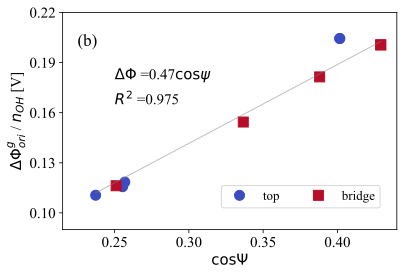

In [26]:

fig = plt.figure(figsize=(6,4))

x=[0.401576699,0.429174955,0.237232612,0.38804553,0.255416079,0.251024017,0.256858796,0.336624717]
y=[-0.204371739,-0.200570277,-0.110569343,-0.181394182,-0.115675144,-0.116237801,-0.118433386,-0.154385846]

y = -np.array(y)

def func(params, x):
    a = params
    return a * x

def error(params, x, y):
    return func(params, x) - y

def slovePara():
    p0 = [10]
    Para = leastsq(error, p0, args=(x,y))
    return Para

def solution():
    Para = slovePara()
    a = Para[0][0]
    print ("a=",a)
    print ("cost:" + str(Para[1]))
    print("y="+str(round(a,2))+"x")
    return a

a = solution()
for i in range(0,8,2):
    plt.plot(x[i],y[i],'o',ms = 10,color = plt.get_cmap('coolwarm')(0))
for i in range(1,8,2):
    plt.plot(x[i],y[i],'o',ms = 10,marker = 's',color = plt.get_cmap('coolwarm')(0.99))

plt.plot(x[0],y[0],'o',ms = 10, color = plt.get_cmap('coolwarm')(0),label='top')    
plt.plot(x[1],y[1],'o',marker = 's',ms = 10,color = plt.get_cmap('coolwarm')(0.99),label='bridge')
x = np.array(x)
y_ = a*x
plt.plot(x,y_,'-',color='gray',alpha = 0.5)

print(r"$R^2$ is ",r2_score(y,y_))
plt.ylabel(r'$\Delta\Phi_{ori}^g$ / $n_{OH}$ [V]',fontsize=fs-5)
plt.xlabel(r'$\cos \Psi$',fontsize=fs-5)
plt.xticks([i/100 for i in range(20,46,5)],fontsize=fs-5)
plt.yticks(-np.array([i/100 for i in range(-22,-9,3)]),fontsize=fs-5)
plt.xlim((0.215,0.44))
plt.ylim((0.09,0.22))
plt.text(0.25, 0.18, r"$\Delta\Phi$ ="+str(round(a,2))+r"$\cos\psi$",fontsize=fs-5)
plt.text(0.25, 0.165, r"$R^2$ ="+str(round(r2_score(y,y_),3)),fontsize=fs-5)
plt.text(0.225, 0.2, r'(b)',fontsize=fs-3)
plt.legend(loc='lower right',bbox_to_anchor=(0.95, 0.1), ncol = 2,borderaxespad=0,fontsize=fs-7)

plt.savefig("../jpcc_pic/si_gas_ori.pdf",bbox_inches = 'tight',dpi=300)

plt.show()